## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [93]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images[1:]:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        #img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #cv2.imshow('img',img)
        #cv2.waitKey(500)
    else:
        print ('Points not found for img %s ' % fname)

#cv2.destroyAllWindows()

Points not found for img ../camera_cal/calibration4.jpg 
Points not found for img ../camera_cal/calibration5.jpg 


## And so on and so forth...

In [94]:
ret, mtx, dist, rvecs, tvecs \
= cv2.calibrateCamera(objpoints, imgpoints, img.shape[:2], None, None)

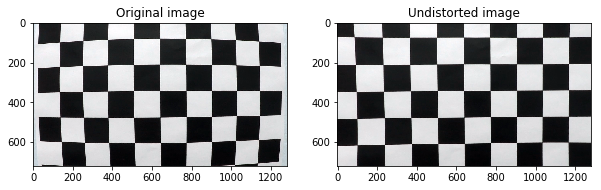

In [95]:
img=cv2.imread(images[0])
dst = cv2.undistort(img, mtx, dist, None, mtx)

fig, ax = plt.subplots(1,2)
fig.set_figheight(10)
fig.set_figwidth(10)

ax[0].imshow(img)
ax[0].set_title('Original image')

ax[1].imshow(dst)
ax[1].set_title('Undistorted image')


plt.show()

In [96]:
def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

In [97]:
import glob

gl=glob.glob('../test_images/*.jpg')

images=[mpl.image.imread(a) for a in gl]

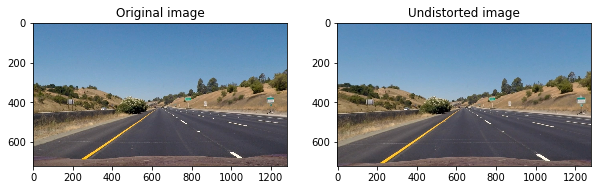

In [98]:
import matplotlib as mpl
img=mpl.image.imread('../test_images/straight_lines1.jpg')
dst = undistort(img)

fig, ax = plt.subplots(1,2)
fig.set_figheight(10)
fig.set_figwidth(10)

ax[0].imshow(img)
ax[0].set_title('Original image')

ax[1].imshow(dst)
ax[1].set_title('Undistorted image')


plt.show()

# с undistort готово, теперь можно разбираться с остальным

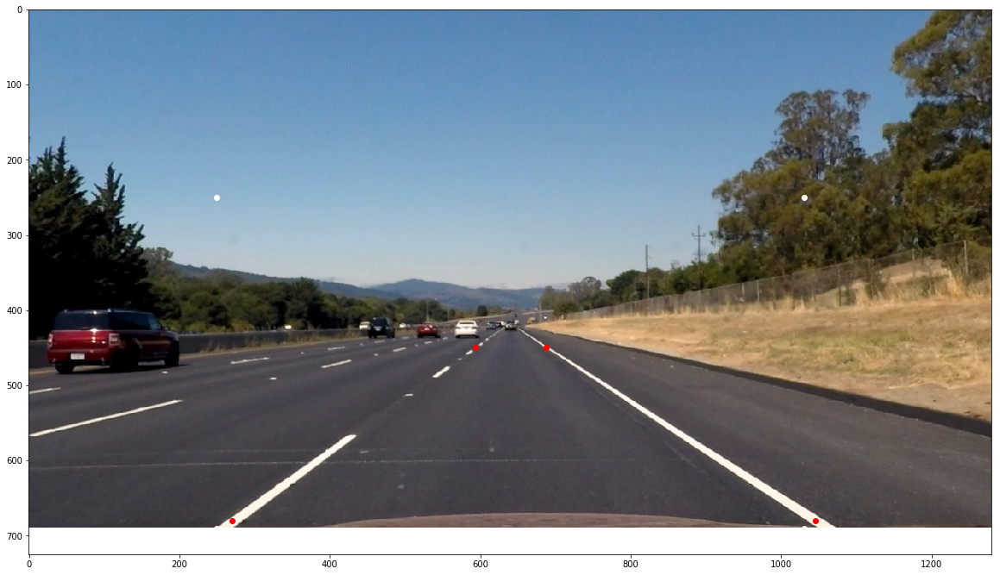

In [165]:
img=mpl.image.imread('../test_images/straight_lines2.jpg')
img=undistort(img)

img=img[:690,:,:]

plt.figure(figsize=(20,20))
plt.imshow(img)

#src=np.float32([[525,500],[img.shape[1]-515,500],[img.shape[1]-235,680],[260,680]])

src=np.float32([[592+2,450],[690-2,450],[img.shape[1]-235,680],[270,680]])

offset=250

dst=np.float32([[offset,offset],[img.shape[1]-offset,offset],\
     [img.shape[1]-offset,img.shape[0]],[offset,img.shape[0]]])

plt.plot([a[0] for a in src],[a[1] for a in src],'ro',color='red')
plt.plot([a[0] for a in dst],[a[1] for a in dst],'ro',color='white')


#plt.plot([260,img.shape[1]-235],[680,680],'ro')
#plt.plot([525,img.shape[1]-515],[500,500],'ro')
plt.show()

In [445]:
#src=np.float32([[525,500],[img.shape[1]-515,500],[img.shape[1]-235,680],[260,680]])
src=np.float32([[592+2,450],[690-2,450],[img.shape[1]-235,680],[270,680]])
src=np.float32([[525,500],[img.shape[1]-515,500],[img.shape[1]-235,680],[260,680]])
offset=250

dst=np.float32([[offset,offset],[img.shape[1]-offset,offset],\
     [img.shape[1]-offset,img.shape[0]],[offset,img.shape[0]]])

#dst=np.float32([[offset,offset],[img.shape[1]-offset,offset],\
#     [img.shape[1]-offset,img.shape[0]-offset],[offset,img.shape[0]-offset]])

M=cv2.getPerspectiveTransform(src,dst)
Minv=cv2.getPerspectiveTransform(dst,src)


def pr(img):
    return cv2.warpPerspective(img[:690],M, (img.shape[1],690), flags=cv2.INTER_LINEAR)

def pr_r(img):
    return cv2.warpPerspective(img,Minv, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)



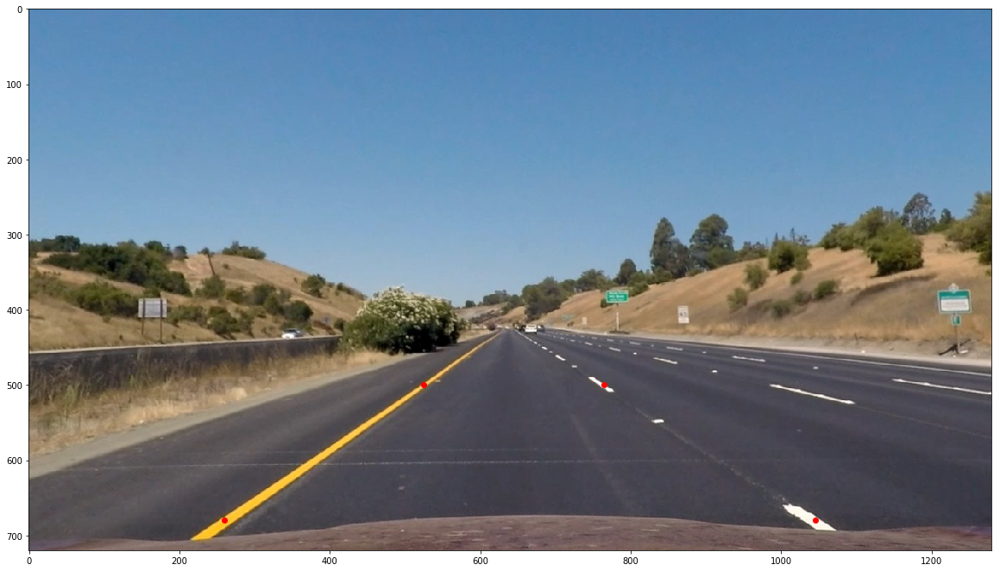

(720, 1280, 3) (690, 1280, 3)


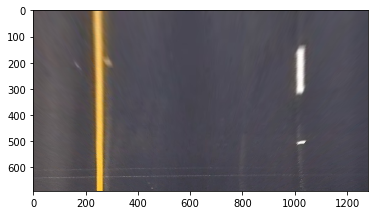

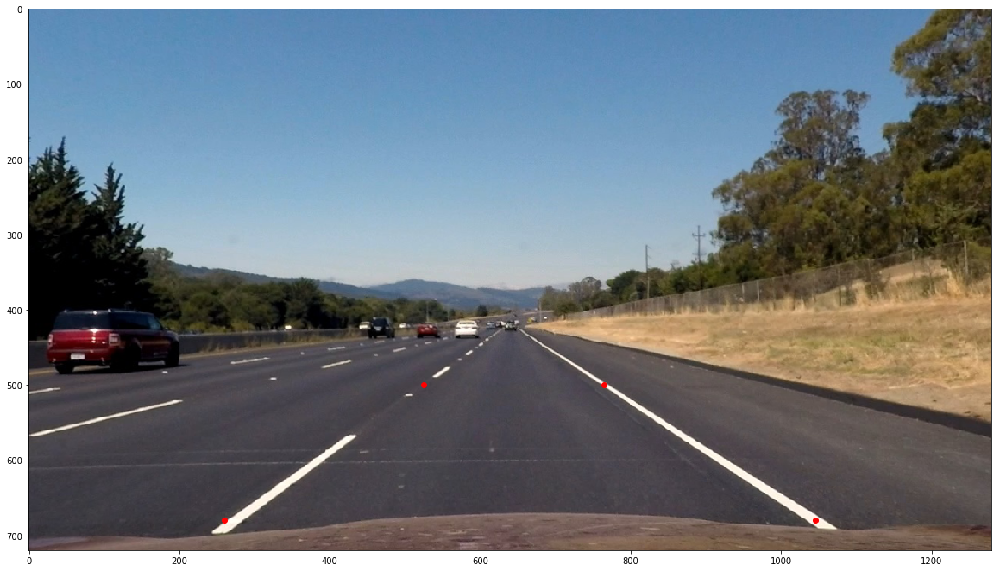

(720, 1280, 3) (690, 1280, 3)


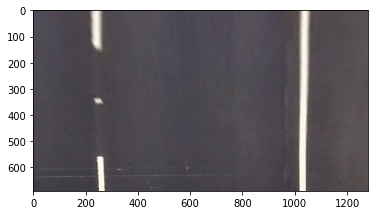

In [446]:
for fname in ('../test_images/straight_lines1.jpg','../test_images/straight_lines2.jpg'):
    img=mpl.image.imread(fname)
    img=undistort(img)


    src=np.float32([[592+2,450],[690-2,450],[img.shape[1]-235,680],[270-2,680]])
    src=np.float32([[525,500],[img.shape[1]-515,500],[img.shape[1]-235,680],[260,680]])
    offset=250

    dst=np.float32([[offset,offset],[img.shape[1]-offset,offset],\
         [img.shape[1]-offset,img.shape[0]],[offset,img.shape[0]]])



    plt.figure(figsize=(20,20))
    plt.imshow(img)

    plt.plot([a[0] for a in src],[a[1] for a in src],'ro',color='red')


    plt.show()

    M=cv2.getPerspectiveTransform(src,dst)
    M_reverse=cv2.getPerspectiveTransform(dst,src)

    warped=pr(img)
    print (img.shape, warped.shape)

    plt.imshow(warped)
    plt.show()

# готовы функции pr и pr_r - проекция и reverse проекции

In [11]:
def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

image=img

trapece=np.array( [[image.shape[1]*0.05, image.shape[0]],\
                        [image.shape[1]*0.95, image.shape[0]],\
                        [image.shape[1]*0.64,image.shape[0]*0.6],\
                       [image.shape[1]*0.36, image.shape[0]*0.6]], np.int32)

    #this is part of our region - we will cut it a little bit after using canny - to crop region
trapece2=trapece+np.array([[1,0],[-1,0],[1,1],[-1,1]])*3

def region_of_interest(img, vertices=trapece):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image



In [662]:
def get_channel(img,channel):
    # take needed channel
    if channel=='gray':
        res = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if channel in ('h','l','s'):
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        if channel=='h':
            res = hls[:,:,0]
        elif channel=='l':
            res = hls[:,:,1] 
        else:
            res = hls[:,:,2]
    if channel in ('L','A','B'):
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
        if  channel=='L':
            res = hls[:,:,0]
        elif channel=='A':
            res = hls[:,:,1] 
        else:
            res = hls[:,:,2]
    return res

def abs_sobel_thresh(img, orient='x', channel='gray',thresh=(0,255),normalize=False,\
                    sobel_kernel=5):
    # take needed channel
    gray=get_channel(img,channel)
        
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, thresh=(0, 255),channel='gray',normalize=False):
    
    # Convert to grayscale
    gray=get_channel(img,channel)
    
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1

    # Return the binary image
    return np.uint8(binary_output)

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2),channel='gray',normalize=False):
    # Grayscale
    gray=get_channel(img,channel)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return np.uint8(binary_output)

def channel_select(img, thresh=(0, 255), channel='gray', normalize=False):
    gray=get_channel(img,channel)
    if normalize:
        gray = gray*(255/gray.max())
    binary_output = np.zeros_like(gray)
    binary_output[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    return np.uint8(binary_output)

functions={'abs_sobel_thresh':abs_sobel_thresh,\
            'mag_thresh':mag_thresh,
            'dir_threshold':dir_threshold,
            'channel_select':channel_select}

def transform_f(params):
    params0=deepcopy(params)
    fname=params0.pop('fname')
    return functions[fname](**params0)

def transform (img, params, operation='max'):
    res=np.zeros(tuple([len(params)]+list(img.shape)[:2]), dtype=np.uint8)
    for i, param in enumerate(params):
        param['img']=img
        res[i]=transform_f(param)
    if operation=='max':
        return res.max(axis=0)
    return res.min(axis=0)
        

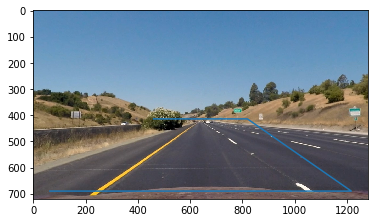

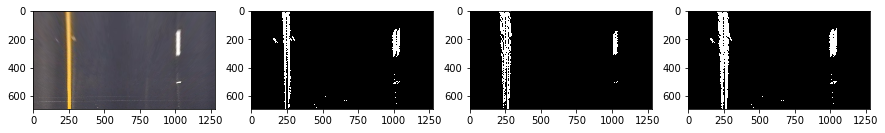

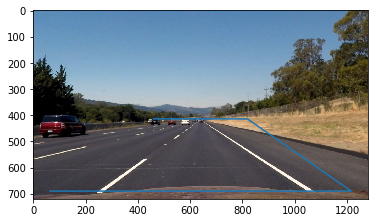

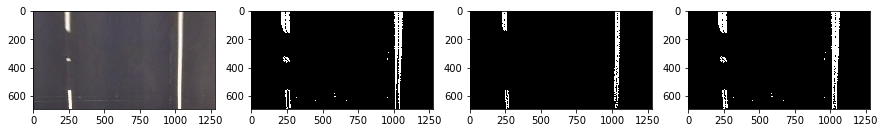

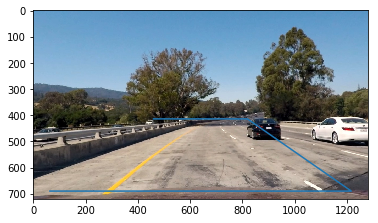

...

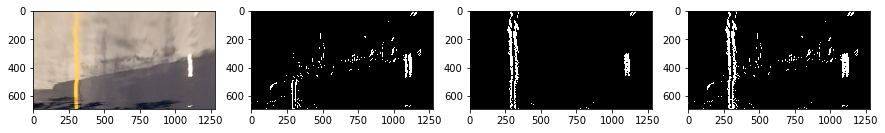

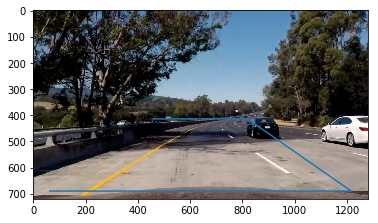

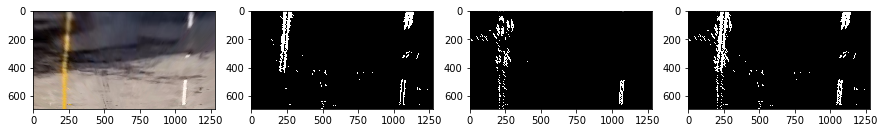

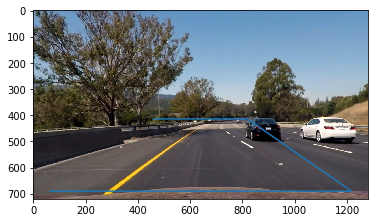

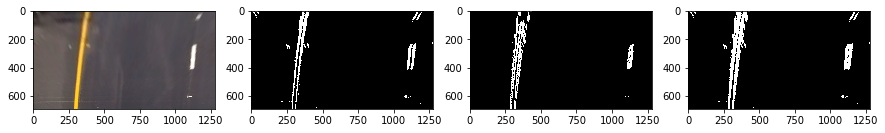

In [447]:
for img in images:
    img=undistort(img)
    plt.imshow(img)
    plt.plot([a[0] for a in trapece],[a[1] for a in trapece])
    
    fig,ax=plt.subplots(1,4)
    fig.set_figheight(10)
    fig.set_figwidth(15)
    
    ax[0].imshow( pr(img))
    l_sobel = abs_sobel_thresh(img, channel='l',  thresh=(15,255))
    ax[1].imshow(pr(l_sobel), cmap='gray')
    s_sobel = abs_sobel_thresh(img, channel='s',  thresh=(25,255))
    ax[2].imshow(pr(s_sobel), cmap='gray')
    s_sobel = abs_sobel_thresh(img, channel='s',  thresh=(25,255))
    ax[3].imshow(pr(s_sobel | l_sobel), cmap='gray')
    
    plt.show()

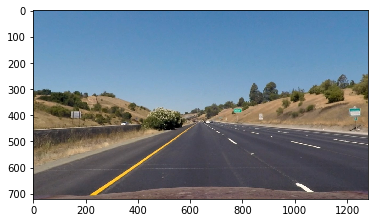

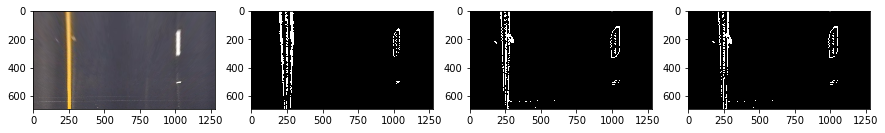

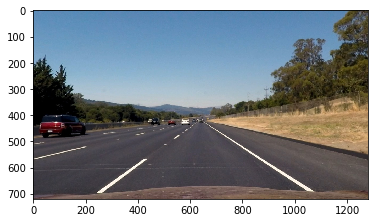

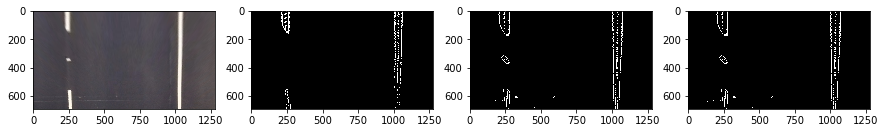

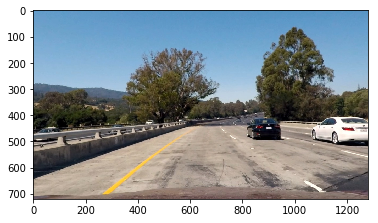

...

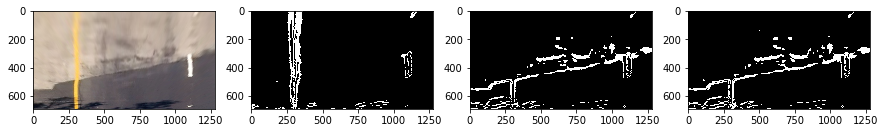

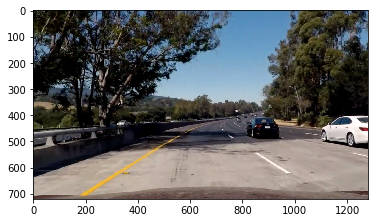

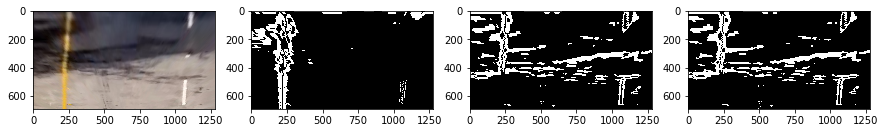

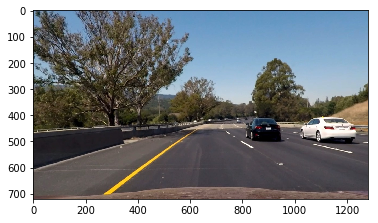

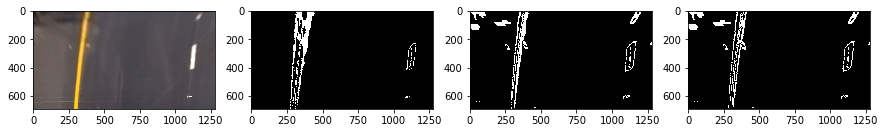

In [448]:
for img in images:
    img=undistort(img)
    plt.imshow(img)
    
    fig,ax=plt.subplots(1,4)
    fig.set_figheight(10)
    fig.set_figwidth(15)
    
    angle=0.4
    
    
    ax[0].imshow(pr(img))
    l_sobel = mag_thresh(img, sobel_kernel=9, thresh=(30, 90), channel='s')
    ax[1].imshow(pr(l_sobel), cmap='gray')
    s_sobel = mag_thresh(img, sobel_kernel=9, thresh=(30, 90), channel='l')
    ax[2].imshow(pr(s_sobel), cmap='gray')
    s_sobel = mag_thresh(img, sobel_kernel=9, thresh=(30, 90), channel='gray')
    ax[3].imshow(pr(s_sobel), cmap='gray')
    
    plt.show()

In [502]:
def binarize(img, l_tresh=15, s_tresh=25):
    "final gradient function"
    l_sobel = abs_sobel_thresh(img, channel='l',  thresh=(l_tresh,255))
    s_sobel = abs_sobel_thresh(img, channel='s',  thresh=(s_tresh,255))
    
    return s_sobel | l_sobel

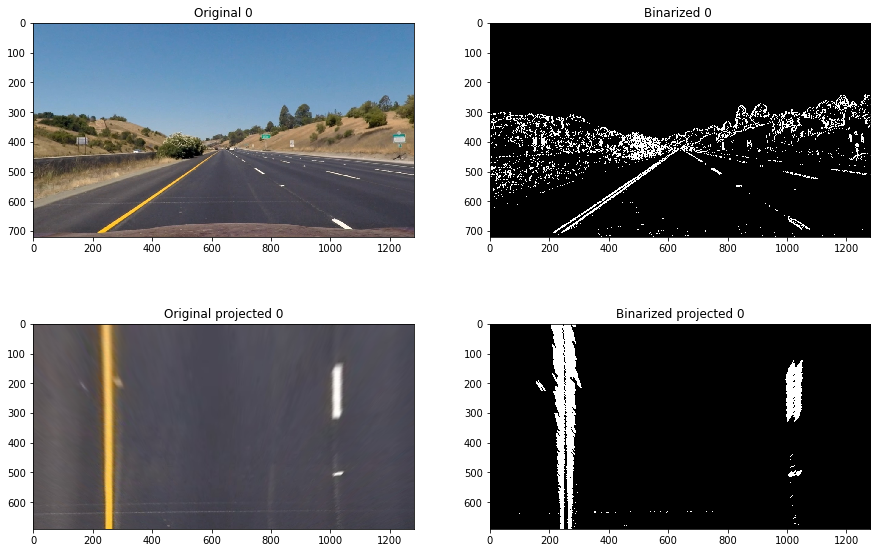

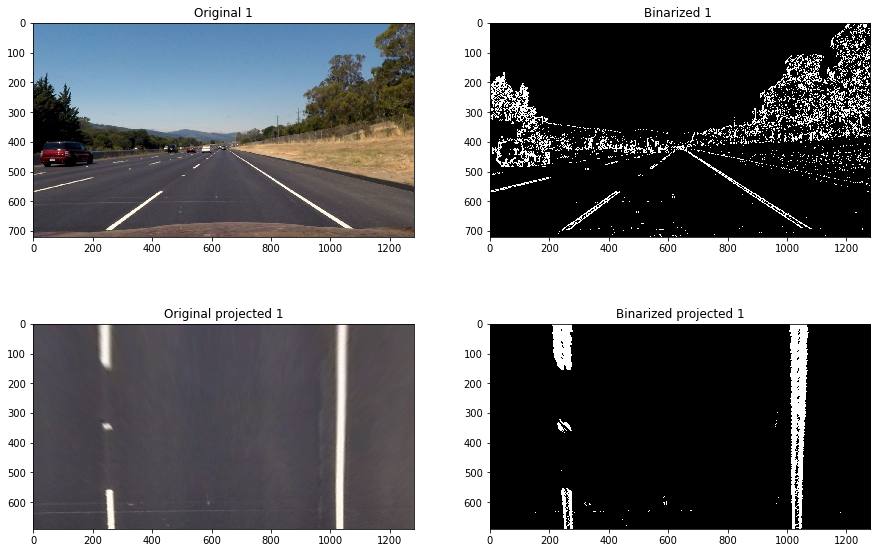

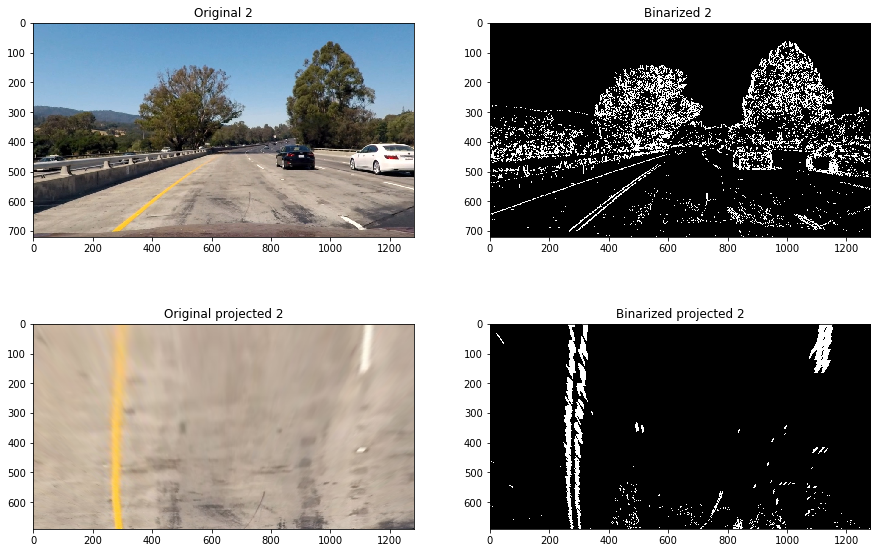

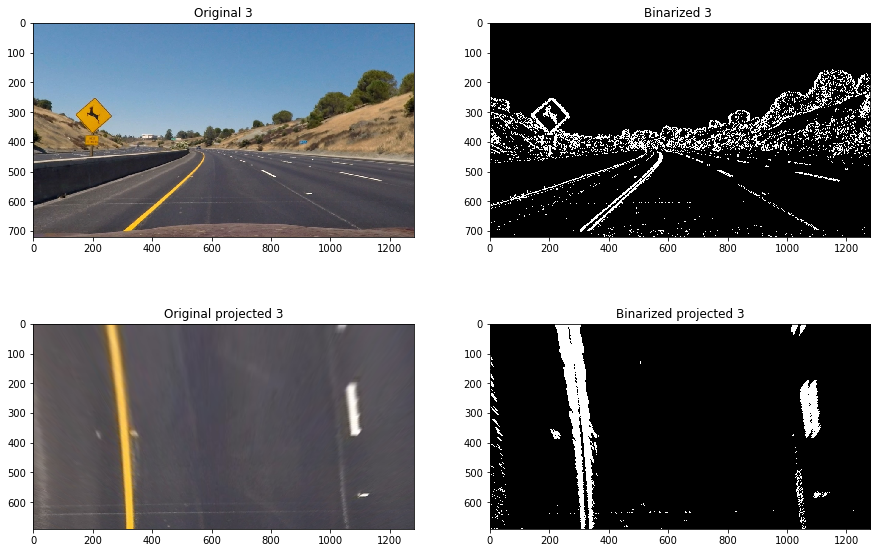

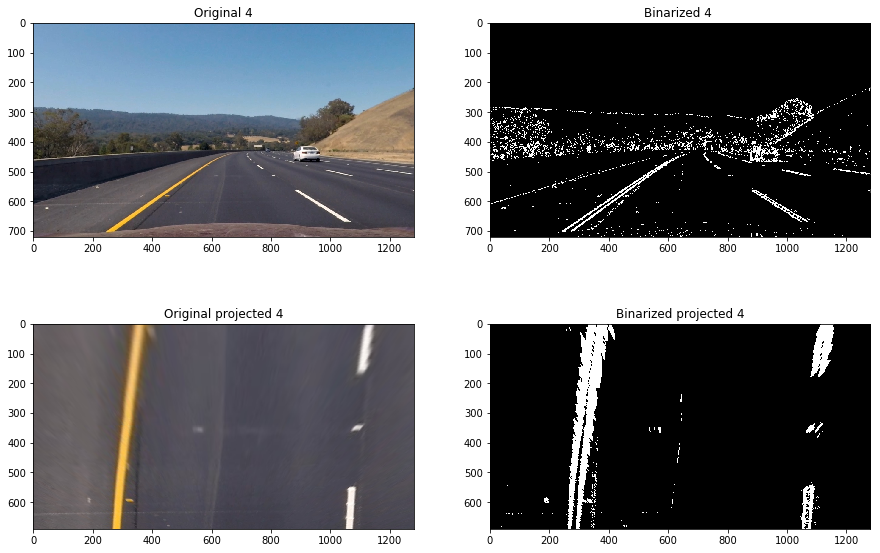

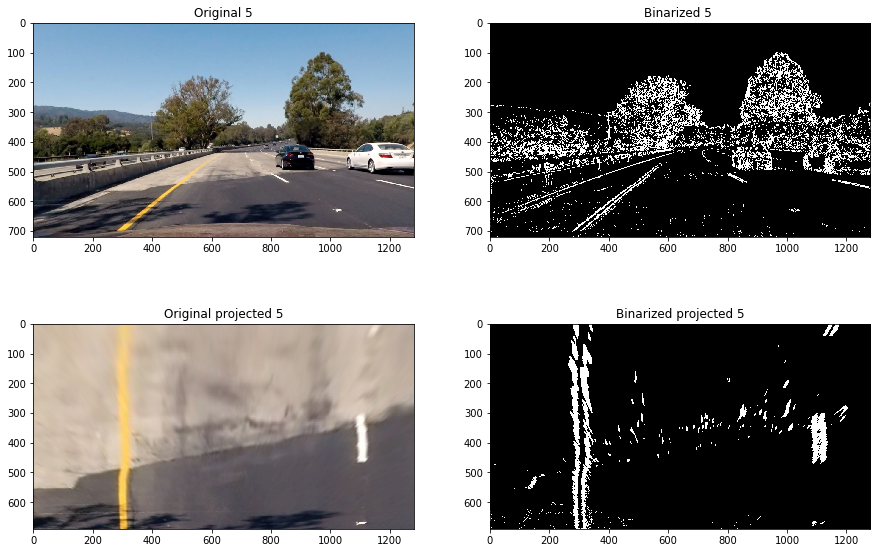

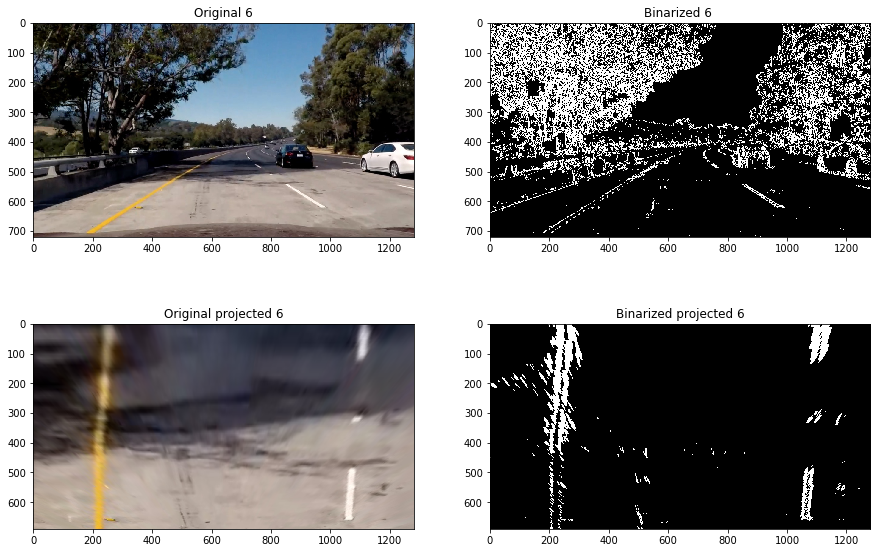

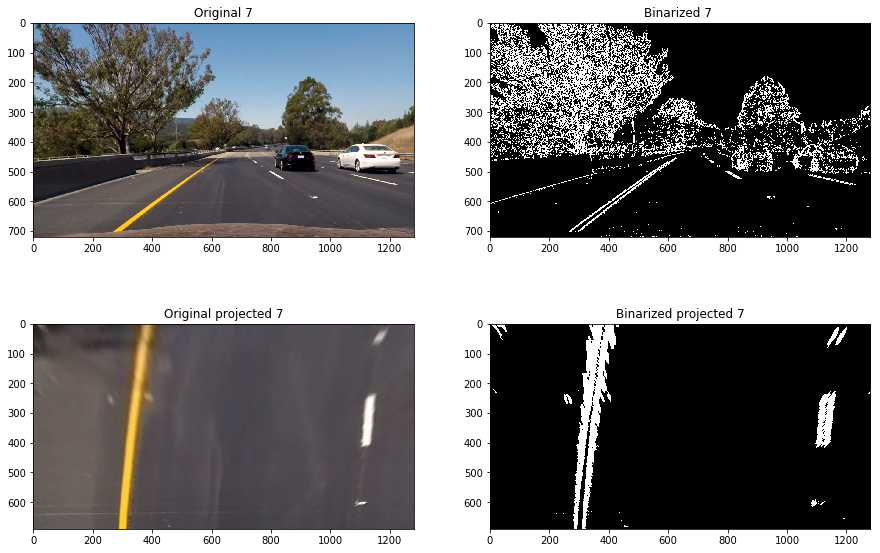

In [450]:
#fig, ax = plt.subplots(len(images)*2,2)

#fig.set_figheight(10*len(images))
#fig.set_figwidth(15)

for j,img in  enumerate(images):
    fig, ax = plt.subplots(2,2)
    fig.set_figheight(10)
    fig.set_figwidth(15)
    i=0
    img=undistort(img)
    
    binimage=binarize(img)
    ax[2*i][0].imshow(img)
    ax[2*i][1].imshow(binimage, cmap='gray')
    ax[2*i+1][1].imshow(pr(binimage),cmap='gray')
    ax[2*i+1][0].imshow(pr(img))
    ax[2*i][0].set_title('Original %d'% j)
    ax[2*i][1].set_title('Binarized %d ' %j )
    ax[2*i+1][0].set_title('Original projected %d' %j)
    ax[2*i+1][1].set_title('Binarized projected %d' %j)
    
    
    plt.show()
    

# теперь будем рисовать линии

import numpy as np
histogram = np.sum(result[result.shape[0]//2:,:], axis=0)
plt.plot(histogram)

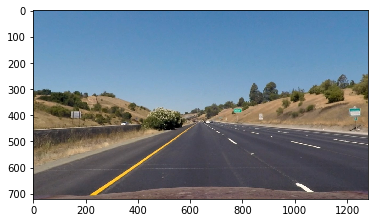

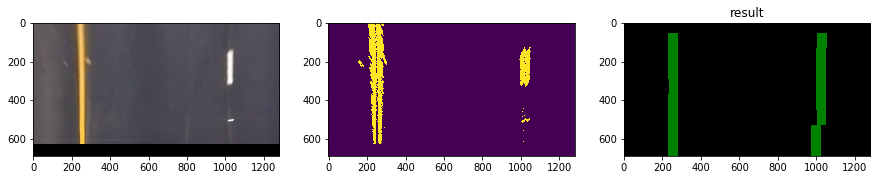

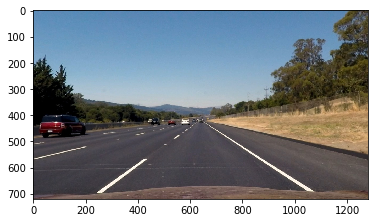

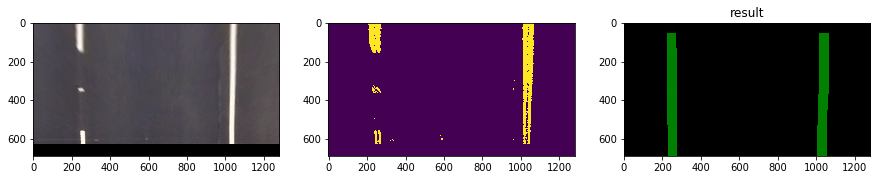

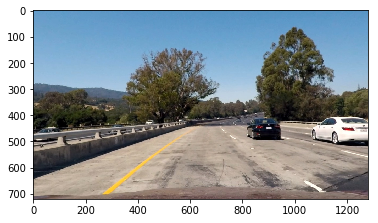

...

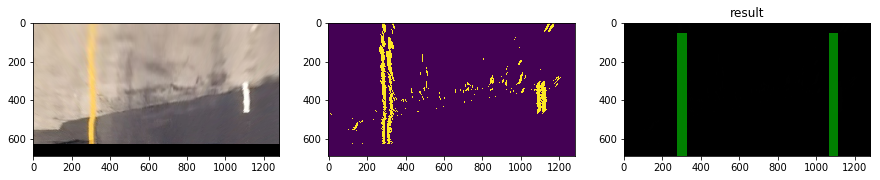

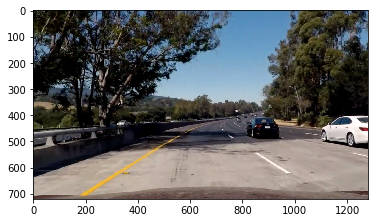

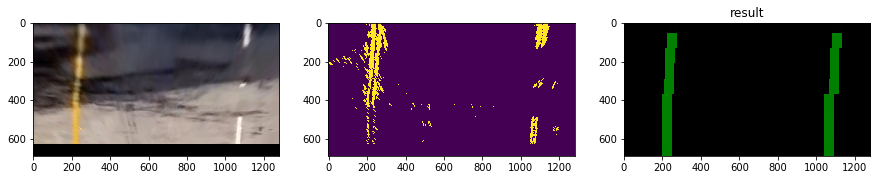

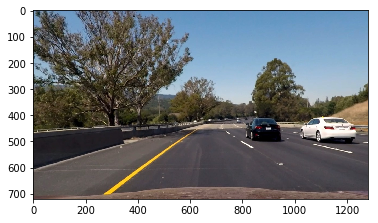

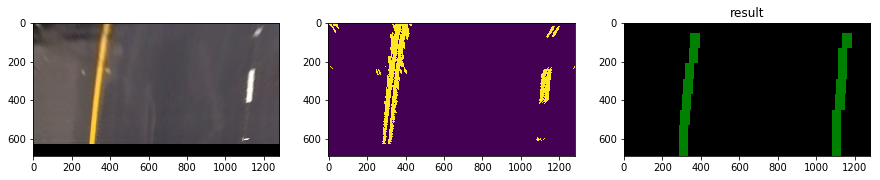

In [451]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2

# Read in a thresholded image
#warped = result
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin,\
                          margin_left=None,margin_right=None, max_tresh=0 ):
    """
    Added left and right margins
    """
    
    if not margin_left:
        margin_left, margin_right = margin,margin
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        #plt.plot (conv_signal)
        #plt.show()
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        
        if l_center>margin:
            l_min_index = int(max(l_center+offset-margin_left,0))
            l_max_index = int(min(l_center+offset+margin_right,warped.shape[1]))
            l_m=conv_signal[l_min_index:l_max_index].max()
            if l_m>max_tresh:
                l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        else:
            l_center=-margin

        # Find the best right centroid by using past right center as a reference
        if r_center>margin:
            r_min_index = int(max(r_center+offset-margin_left,0))
            r_max_index = int(min(r_center+offset+margin_right,warped.shape[1]))
            r_m=conv_signal[r_min_index:r_max_index].max()
            #print (r_m)
            if r_m>max_tresh:
                r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
            
            
        else:
            r_center=warped.shape[1]+margin
        
        
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def draw_window_centroids(window_centroids):
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

        # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    return output

for img in images:
    img=undistort(img)
    plt.imshow(img)
    plt.show()
    img=img[:600,:,:]
    warped=pr(binarize(img))
    
    window_centroids=find_window_centroids(img, window_width, window_height, margin)
    
    m=(np.array(window_centroids)[1:]-np.array(window_centroids)[:-1]).mean()
    
    if m>0:
        window_centroids=find_window_centroids(img, window_width, window_height, margin,\
                                           margin_left=1,margin_right=100)
    else:
        window_centroids=find_window_centroids(img, window_width, window_height, margin,\
                                           margin_left=100,margin_right=1, max_tresh=1000)
    
    output=draw_window_centroids(window_centroids)
    # Display the final results
    
    fig,ax=plt.subplots(1,3)
    fig.set_figheight(10)
    fig.set_figwidth(15)
    
    ax[0].imshow(pr(img))
    ax[1].imshow(warped)
    ax[2].imshow(output)
    ax[2].set_title('result')
    plt.show()




In [452]:
(np.array(window_centroids)[1:]-np.array(window_centroids)[:-1]).mean()

8.1428571428571423

In [506]:
def fit_poly (binary_warped, verbose=False):

    #binary_warped = pr(binarize(img))

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom 1/4 of the image
    histogram = np.sum(binary_warped[int(3*binary_warped.shape[0]/4):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    #leftx_base = np.argmax(histogram[:midpoint])
    #rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    leftx_base = np.argmax(histogram[100:450])+100
    rightx_base = np.argmax(histogram[1280-450:1280-100]) + 1280-450



    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    #left and right centers
    left_centers=[]
    right_centers=[]

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image

        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            left_centers.append(leftx_current)
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            right_centers.append(rightx_current)

    #get lines direction
    left_dir=np.array(right_centers)[:-1]-np.array(right_centers)[1:]
    right_dir=np.array(right_centers)[:-1]-np.array(right_centers)[1:]
    direction = np.concatenate([left_dir, right_dir]).mean()

    #if direction<-20:
    #    good_left=np.where(left_dir<0)[0]
    #    good_right=np.where(right_dir<0)[0]
    #elif direction>20:
    #    good_left=np.where(left_dir>0)[0]
    #    good_right=np.where(right_dir>0)[0]
    if True:
        good_left=range(len(left_dir)+1)
        good_right=range(len(right_dir)+1)
        
    t=50
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)#[left_lane_inds[a] for a in good_left\
                                   #if len(left_lane_inds[a])>t])
    right_lane_inds = np.concatenate(right_lane_inds)#[right_lane_inds[a]  for a in good_right\
                                    #if len(right_lane_inds[a])>t])
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    if verbose:
        fig,ax=plt.subplots(1,2)
        fig.set_figheight(10)
        fig.set_figwidth(15)

        ax[0].imshow(out_img)

        ax[1].imshow(binary_warped,cmap='gray')
        ax[1].plot(left_fitx, ploty, color='yellow')
        ax[1].plot(right_fitx, ploty, color='yellow')
        ax[1].set_xlim(0, 1280)
        ax[1].set_ylim(720, 0)
        plt.show()
    return left_fit, right_fit

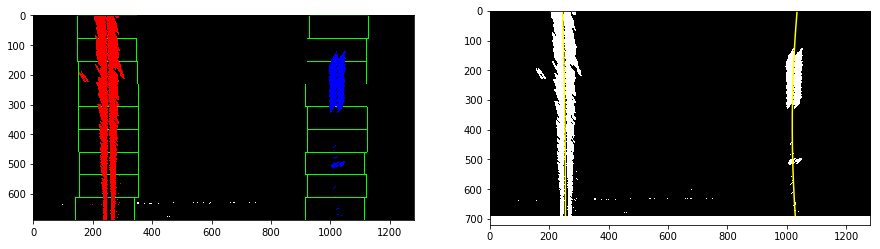

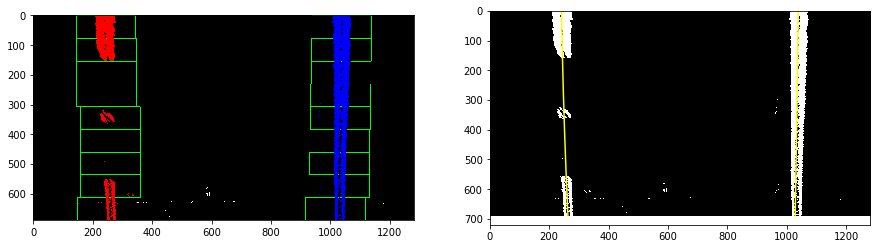

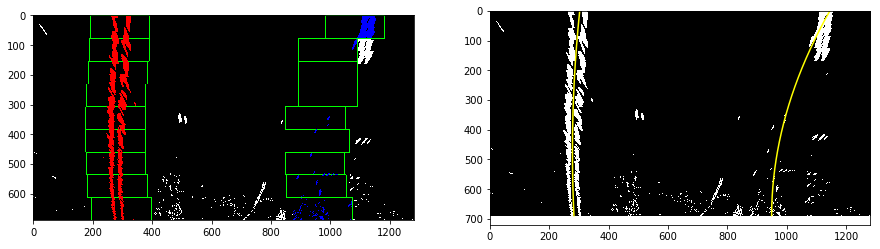

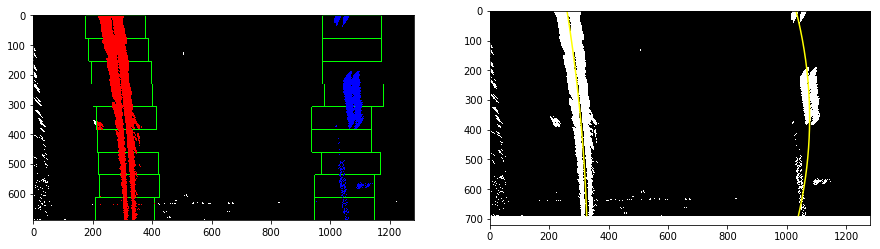

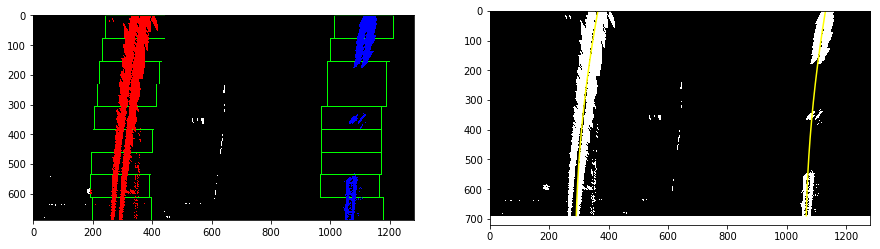

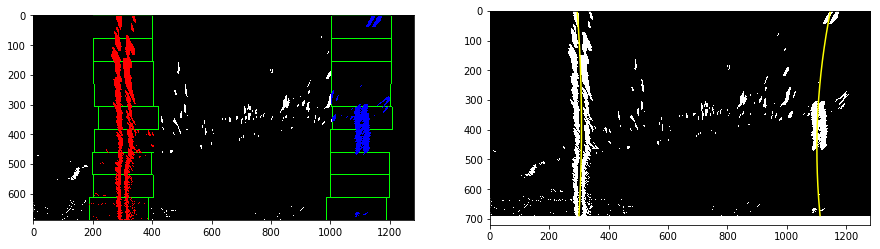

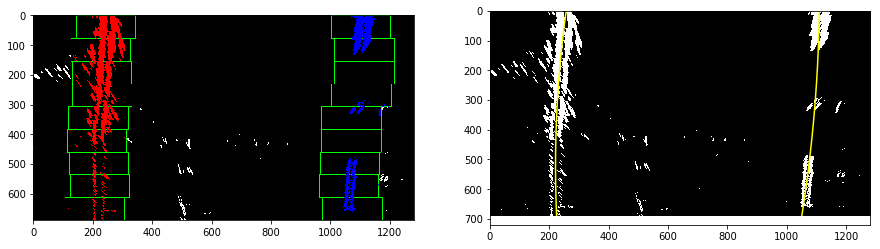

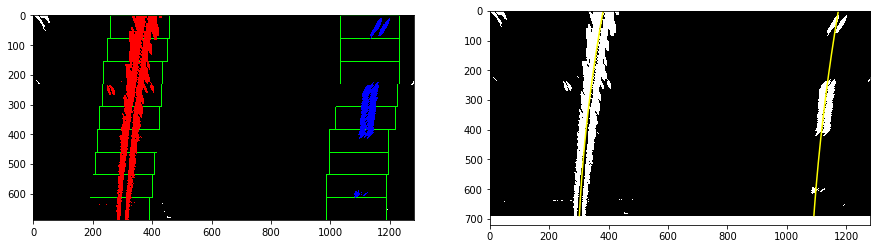

In [462]:
for img in images:
    binary_warped = pr(binarize(undistort(img)))

    fit_poly(binary_warped,verbose=True)

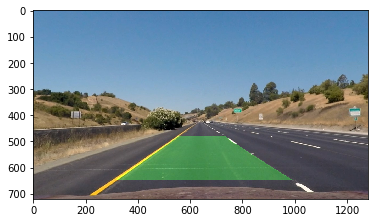

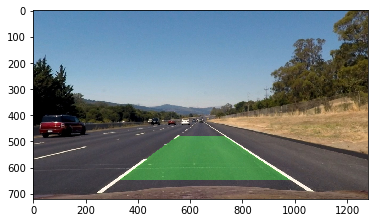

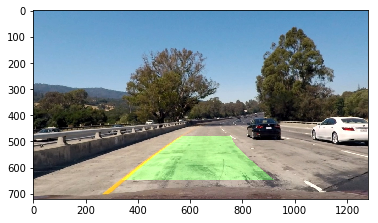

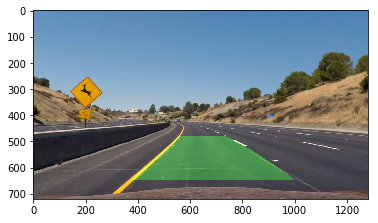

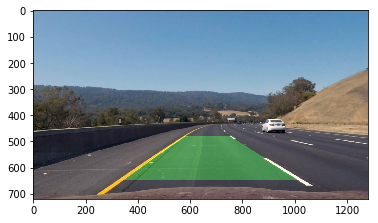

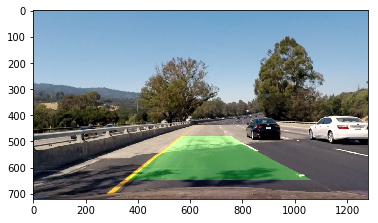

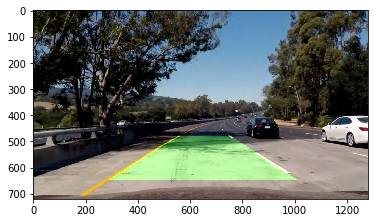

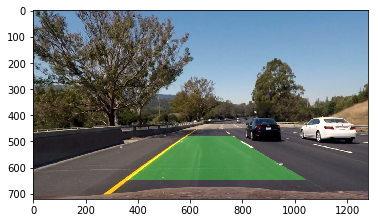

In [463]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

for image in images:
    
    image=undistort(image)
    binary_warped=pr(binarize(image))
    
    
    left_fit, right_fit = fit_poly(binary_warped, verbose=False)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw the lines on
    color_warp = np.zeros_like(image).astype(np.uint8)
    #color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    plt.imshow(result)
    plt.show()

In [825]:
from itertools import product

class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        
        self.recent_fitted=[]
        
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
        self.errors=[]
        
        self.cnt_errors=0
        
        self.images=[]
        
        self.last_good=None
        
        
        self.functions=\
        [(binarize_yellow,{})]+\
        [(binarize_yellow,{'f':binarize,'params':{'l_tresh':a[0],'s_tresh':a[1]}}) \
                   for a in max_sorted(product(range(5,50,5),range(5,50,5)))]+\
        [(binarize,{'l_tresh':a[0],'s_tresh':a[1]}) \
                   for a in max_sorted(product(range(5,50,5),range(5,50,5)))]+\
        [(binarize_absl,{'s_thresh':a[0],'l_thresh':a[1],'sx_thresh':a[2]}) \
                   for a in max_sorted(product(range(5,50,5),range(5,50,5),range(5,120,5)))]
        
        self.functions=\
        [(binarize_yellow,{})]

       
    def visualise(self,image,binary_warped):
        left_fit, right_fit = self.best_fit
        
        
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        # Create an image to draw the lines on
        color_warp = np.zeros_like(image).astype(np.uint8)

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        
        color=(0,255,0) if self.detected else (0,0, 255)
        
        if self.cnt_errors>5:
            color=(255,0,0)
        
        cv2.fillPoly(color_warp, np.int_([pts]), color)
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
        
        # Combine the result with the original image
        result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
        return result
    
    def check_lines(self,lines):
        """
        Checking that lines are almost parallel and distance between them is big
        """
        self.detected=False
        div=np.abs(lines[0]-lines[1])
        if div[0]<0.0004 and div[1]<0.7 and div[2]>600 and div[2]<950:
            self.detected=True
            
        return self.detected
            
    def find_by_poly(self,binary_warped,left_fit, right_fit):
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 100
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        
        return left_fit, right_fit
        
    def process_img(self, img, verbose=False, binarize=binarize):
        self.images.append(img)
        image=undistort(img)
        prj=pr(image)
        
        self.detected=False
        
        
        
        for f,params in self.functions:
            #binary_warped = (binarize(pr(image)))
            binary_warped=f(prj,**params)

            #if not fitted or too many erors
            if not self.best_fit or self.cnt_errors>5:
                if 1==1:
                    left_fit, right_fit= fit_poly(binary_warped, verbose=verbose)
                    self.recent_fitted=[]
                else:
                    left_fit, right_fit= self.best_fit
            else:  
                left_fit, right_fit= self.best_fit

            #trying normal process
            if 1==1:
                left_fit, right_fit = self.find_by_poly(binary_warped,left_fit, right_fit)
                check=self.check_lines((left_fit,right_fit))
                
            else:
                if 1==1:
                    left_fit, right_fit= fit_poly(binary_warped, verbose=verbose)
                    check=self.check_lines((left_fit,right_fit))
                else:
                    check=False
                    
            if check:
                break
                
        self.detected=check
        if not check and self.best_fit:
            left_fit, right_fit= self.best_fit
       
        #if fit is ok than save it
        if check:
            self.cnt_errors=0
            self.recent_fitted.append((left_fit, right_fit))
            
            self.best_fit = (np.mean([a[0] for a in l.recent_fitted[-5:]],axis=0),\
                             np.mean([a[1] for a in l.recent_fitted[-5:]],axis=0))
        elif self.cnt_errors>5:
            self.recent_fitted=[]
            self.recent_fitted.append((left_fit, right_fit))
            self.best_fit = (left_fit, right_fit)
        else:
            self.cnt_errors+=1
            self.errors.append((img,(left_fit, right_fit),self.best_fit))
            if not self.best_fit:
                self.best_fit = (left_fit, right_fit)
        
        return self.visualise(image, binary_warped)
        

In [789]:
(l.best_fit[0]-l.best_fit[1]).tolist()

[0.000516669417432725, -0.5112661567166707, -678.012971776086]

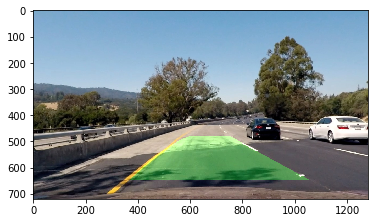

In [798]:
img=images[-3]
#plt.imshow(img)
#plt.show()

l=Line()
plt.imshow(l.process_img(img))
plt.show()

In [418]:
%%sh

mkdir project

In [826]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

l=Line()

clip1 = VideoFileClip('../challenge_video.mp4')
white_clip = clip1.fl_image(l.process_img) #NOTE: this function expects color images!!
white_clip.write_videofile('chalenge.mp4', audio=False)




[MoviePy] >>>> Building video project_video.mp4
[MoviePy] Writing video project_video.mp4







  0%|          | 0/1261 [00:00<?, ?it/s]




  0%|          | 1/1261 [00:00<04:29,  4.67it/s]




  0%|          | 2/1261 [00:00<04:15,  4.92it/s]




  0%|          | 3/1261 [00:00<04:03,  5.16it/s]




  0%|          | 4/1261 [00:00<03:54,  5.37it/s]




  0%|          | 5/1261 [00:00<03:50,  5.45it/s]




  0%|          | 6/1261 [00:01<04:19,  4.84it/s]




  1%|          | 7/1261 [00:01<04:04,  5.13it/s]




  1%|          | 8/1261 [00:01<04:05,  5.09it/s]




  1%|          | 9/1261 [00:01<03:58,  5.26it/s]




  1%|          | 10/1261 [00:01<03:53,  5.37it/s]




  1%|          | 11/1261 [00:02<03:48,  5.46it/s]




  1%|          | 12/1261 [00:02<03:42,  5.62it/s]




  1%|          | 13/1261 [00:02<03:39,  5.68it/s]




  1%|          | 14/1261 [00:02<03:41,  5.62it/s]




  1%|          | 15/1261 [00:02<03:51,  5.39it/s]




  1%|▏         | 16/1261 [00:03<04:00,  5.18it/s]




  1%|▏         | 17/1261 [00:03<03:59,  5.18it/s]




  1%|▏         | 18/1261 [00:03<04:05,  5

  9%|▉         | 118/1261 [00:24<03:51,  4.93it/s]




  9%|▉         | 119/1261 [00:24<03:50,  4.96it/s]




 10%|▉         | 120/1261 [00:24<03:46,  5.03it/s]




 10%|▉         | 121/1261 [00:24<03:46,  5.03it/s]




 10%|▉         | 122/1261 [00:25<03:46,  5.02it/s]




 10%|▉         | 123/1261 [00:25<03:45,  5.04it/s]




 10%|▉         | 124/1261 [00:25<03:45,  5.04it/s]




 10%|▉         | 125/1261 [00:25<03:47,  5.00it/s]




 10%|▉         | 126/1261 [00:25<03:50,  4.93it/s]




 10%|█         | 127/1261 [00:26<03:46,  5.00it/s]




 10%|█         | 128/1261 [00:26<03:45,  5.03it/s]




 10%|█         | 129/1261 [00:26<03:40,  5.12it/s]




 10%|█         | 130/1261 [00:26<03:39,  5.14it/s]




 10%|█         | 131/1261 [00:26<03:37,  5.20it/s]




 10%|█         | 132/1261 [00:27<03:35,  5.24it/s]




 11%|█         | 133/1261 [00:27<03:35,  5.22it/s]




 11%|█         | 134/1261 [00:27<03:39,  5.14it/s]




 11%|█         | 135/1261 [00:27<03:37,  5.17it/s]




 11%|█    

 19%|█▊        | 235/1261 [00:47<03:15,  5.25it/s]




 19%|█▊        | 236/1261 [00:47<03:14,  5.27it/s]




 19%|█▉        | 237/1261 [00:48<03:16,  5.21it/s]




 19%|█▉        | 238/1261 [00:48<03:22,  5.06it/s]




 19%|█▉        | 239/1261 [00:48<03:18,  5.14it/s]




 19%|█▉        | 240/1261 [00:48<03:16,  5.20it/s]




 19%|█▉        | 241/1261 [00:48<03:16,  5.18it/s]




 19%|█▉        | 242/1261 [00:49<03:18,  5.13it/s]




 19%|█▉        | 243/1261 [00:49<03:16,  5.19it/s]




 19%|█▉        | 244/1261 [00:49<03:14,  5.22it/s]




 19%|█▉        | 245/1261 [00:49<03:14,  5.21it/s]




 20%|█▉        | 246/1261 [00:49<03:12,  5.27it/s]




 20%|█▉        | 247/1261 [00:50<03:10,  5.34it/s]




 20%|█▉        | 248/1261 [00:50<03:08,  5.37it/s]




 20%|█▉        | 249/1261 [00:50<03:06,  5.43it/s]




 20%|█▉        | 250/1261 [00:50<03:06,  5.43it/s]




 20%|█▉        | 251/1261 [00:50<03:05,  5.44it/s]




 20%|█▉        | 252/1261 [00:51<03:07,  5.39it/s]




 20%|██   

 28%|██▊       | 352/1261 [01:10<02:51,  5.30it/s]




 28%|██▊       | 353/1261 [01:10<02:53,  5.22it/s]




 28%|██▊       | 354/1261 [01:10<02:55,  5.17it/s]




 28%|██▊       | 355/1261 [01:11<02:56,  5.15it/s]




 28%|██▊       | 356/1261 [01:11<03:00,  5.01it/s]




 28%|██▊       | 357/1261 [01:11<03:07,  4.83it/s]




 28%|██▊       | 358/1261 [01:11<03:00,  5.00it/s]




 28%|██▊       | 359/1261 [01:11<03:05,  4.86it/s]




 29%|██▊       | 360/1261 [01:12<03:08,  4.79it/s]




 29%|██▊       | 361/1261 [01:12<03:19,  4.52it/s]




 29%|██▊       | 362/1261 [01:12<03:24,  4.40it/s]




 29%|██▉       | 363/1261 [01:12<03:19,  4.50it/s]




 29%|██▉       | 364/1261 [01:13<03:24,  4.38it/s]




 29%|██▉       | 365/1261 [01:13<03:17,  4.53it/s]




 29%|██▉       | 366/1261 [01:13<03:11,  4.66it/s]




 29%|██▉       | 367/1261 [01:13<03:12,  4.65it/s]




 29%|██▉       | 368/1261 [01:13<03:08,  4.75it/s]




 29%|██▉       | 369/1261 [01:14<03:14,  4.60it/s]




 29%|██▉  

 37%|███▋      | 469/1261 [01:34<02:42,  4.88it/s]




 37%|███▋      | 470/1261 [01:35<02:41,  4.89it/s]




 37%|███▋      | 471/1261 [01:35<02:41,  4.90it/s]




 37%|███▋      | 472/1261 [01:35<02:47,  4.72it/s]




 38%|███▊      | 473/1261 [01:35<02:38,  4.98it/s]




 38%|███▊      | 474/1261 [01:35<02:57,  4.44it/s]




 38%|███▊      | 475/1261 [01:36<02:44,  4.77it/s]




 38%|███▊      | 476/1261 [01:36<02:38,  4.95it/s]




 38%|███▊      | 477/1261 [01:36<02:52,  4.55it/s]




 38%|███▊      | 478/1261 [01:36<02:40,  4.89it/s]




 38%|███▊      | 479/1261 [01:36<02:40,  4.86it/s]




 38%|███▊      | 480/1261 [01:37<02:50,  4.59it/s]




 38%|███▊      | 481/1261 [01:37<02:53,  4.50it/s]




 38%|███▊      | 482/1261 [01:37<02:46,  4.67it/s]




 38%|███▊      | 483/1261 [01:37<02:42,  4.78it/s]




 38%|███▊      | 484/1261 [01:38<02:36,  4.98it/s]




 38%|███▊      | 485/1261 [01:38<02:31,  5.13it/s]




 39%|███▊      | 486/1261 [01:38<02:40,  4.83it/s]




 39%|███▊ 

 46%|████▋     | 586/1261 [01:56<02:21,  4.78it/s]




 47%|████▋     | 587/1261 [01:56<02:17,  4.91it/s]




 47%|████▋     | 588/1261 [01:56<02:09,  5.18it/s]




 47%|████▋     | 589/1261 [01:56<02:06,  5.33it/s]




 47%|████▋     | 590/1261 [01:57<02:03,  5.44it/s]




 47%|████▋     | 591/1261 [01:57<02:02,  5.46it/s]




 47%|████▋     | 592/1261 [01:57<02:02,  5.48it/s]




 47%|████▋     | 593/1261 [01:57<02:03,  5.41it/s]




 47%|████▋     | 594/1261 [01:57<02:02,  5.45it/s]




 47%|████▋     | 595/1261 [01:58<02:07,  5.22it/s]




 47%|████▋     | 596/1261 [01:58<02:03,  5.37it/s]




 47%|████▋     | 597/1261 [01:58<02:12,  5.00it/s]




 47%|████▋     | 598/1261 [01:58<02:10,  5.08it/s]




 48%|████▊     | 599/1261 [01:58<02:17,  4.83it/s]




 48%|████▊     | 600/1261 [01:59<02:19,  4.73it/s]




 48%|████▊     | 601/1261 [01:59<02:20,  4.70it/s]




 48%|████▊     | 602/1261 [01:59<02:19,  4.72it/s]




 48%|████▊     | 603/1261 [01:59<02:22,  4.63it/s]




 48%|████▊

 56%|█████▌    | 703/1261 [02:21<02:08,  4.35it/s]




 56%|█████▌    | 704/1261 [02:21<02:00,  4.62it/s]




 56%|█████▌    | 705/1261 [02:21<01:58,  4.67it/s]




 56%|█████▌    | 706/1261 [02:21<01:54,  4.86it/s]




 56%|█████▌    | 707/1261 [02:21<01:51,  4.96it/s]




 56%|█████▌    | 708/1261 [02:22<01:48,  5.09it/s]




 56%|█████▌    | 709/1261 [02:22<01:48,  5.11it/s]




 56%|█████▋    | 710/1261 [02:22<01:58,  4.64it/s]




 56%|█████▋    | 711/1261 [02:22<02:04,  4.40it/s]




 56%|█████▋    | 712/1261 [02:23<02:09,  4.23it/s]




 57%|█████▋    | 713/1261 [02:23<02:14,  4.08it/s]




 57%|█████▋    | 714/1261 [02:23<02:17,  3.98it/s]




 57%|█████▋    | 715/1261 [02:23<02:36,  3.49it/s]




 57%|█████▋    | 716/1261 [02:24<03:20,  2.72it/s]




 57%|█████▋    | 717/1261 [02:24<02:53,  3.13it/s]




 57%|█████▋    | 718/1261 [02:24<02:45,  3.28it/s]




 57%|█████▋    | 719/1261 [02:25<02:25,  3.73it/s]




 57%|█████▋    | 720/1261 [02:25<02:23,  3.78it/s]




 57%|█████

 65%|██████▌   | 820/1261 [02:51<01:44,  4.23it/s]




 65%|██████▌   | 821/1261 [02:51<01:38,  4.46it/s]




 65%|██████▌   | 822/1261 [02:52<01:46,  4.12it/s]




 65%|██████▌   | 823/1261 [02:52<01:44,  4.20it/s]




 65%|██████▌   | 824/1261 [02:52<01:41,  4.30it/s]




 65%|██████▌   | 825/1261 [02:52<01:46,  4.09it/s]




 66%|██████▌   | 826/1261 [02:53<01:50,  3.94it/s]




 66%|██████▌   | 827/1261 [02:53<01:57,  3.70it/s]




 66%|██████▌   | 828/1261 [02:53<01:44,  4.14it/s]




 66%|██████▌   | 829/1261 [02:53<01:44,  4.14it/s]




 66%|██████▌   | 830/1261 [02:54<01:50,  3.90it/s]




 66%|██████▌   | 831/1261 [02:54<01:57,  3.67it/s]




 66%|██████▌   | 832/1261 [02:54<01:52,  3.82it/s]




 66%|██████▌   | 833/1261 [02:54<01:54,  3.74it/s]




 66%|██████▌   | 834/1261 [02:55<01:51,  3.84it/s]




 66%|██████▌   | 835/1261 [02:55<01:46,  4.01it/s]




 66%|██████▋   | 836/1261 [02:55<01:48,  3.93it/s]




 66%|██████▋   | 837/1261 [02:55<01:41,  4.17it/s]




 66%|█████

 74%|███████▍  | 937/1261 [03:16<00:58,  5.57it/s]




 74%|███████▍  | 938/1261 [03:16<00:57,  5.63it/s]




 74%|███████▍  | 939/1261 [03:16<00:57,  5.57it/s]




 75%|███████▍  | 940/1261 [03:17<00:59,  5.38it/s]




 75%|███████▍  | 941/1261 [03:17<00:57,  5.53it/s]




 75%|███████▍  | 942/1261 [03:17<00:55,  5.72it/s]




 75%|███████▍  | 943/1261 [03:17<00:54,  5.79it/s]




 75%|███████▍  | 944/1261 [03:17<00:54,  5.87it/s]




 75%|███████▍  | 945/1261 [03:17<00:53,  5.91it/s]




 75%|███████▌  | 946/1261 [03:18<00:55,  5.70it/s]




 75%|███████▌  | 947/1261 [03:18<00:54,  5.81it/s]




 75%|███████▌  | 948/1261 [03:18<00:52,  5.91it/s]




 75%|███████▌  | 949/1261 [03:18<00:52,  5.98it/s]




 75%|███████▌  | 950/1261 [03:18<00:51,  6.04it/s]




 75%|███████▌  | 951/1261 [03:18<00:51,  6.05it/s]




 75%|███████▌  | 952/1261 [03:19<00:51,  6.03it/s]




 76%|███████▌  | 953/1261 [03:19<00:51,  5.96it/s]




 76%|███████▌  | 954/1261 [03:19<00:51,  5.97it/s]




 76%|█████

 84%|████████▎ | 1053/1261 [03:38<00:46,  4.49it/s]




 84%|████████▎ | 1054/1261 [03:38<00:52,  3.91it/s]




 84%|████████▎ | 1055/1261 [03:38<00:49,  4.16it/s]




 84%|████████▎ | 1056/1261 [03:39<00:47,  4.31it/s]




 84%|████████▍ | 1057/1261 [03:39<00:44,  4.60it/s]




 84%|████████▍ | 1058/1261 [03:39<00:43,  4.71it/s]




 84%|████████▍ | 1059/1261 [03:39<00:40,  4.98it/s]




 84%|████████▍ | 1060/1261 [03:39<00:38,  5.16it/s]




 84%|████████▍ | 1061/1261 [03:40<00:38,  5.21it/s]




 84%|████████▍ | 1062/1261 [03:40<00:39,  5.07it/s]




 84%|████████▍ | 1063/1261 [03:40<00:53,  3.68it/s]




 84%|████████▍ | 1064/1261 [03:41<00:55,  3.53it/s]




 84%|████████▍ | 1065/1261 [03:41<01:15,  2.58it/s]




 85%|████████▍ | 1066/1261 [03:42<01:09,  2.81it/s]




 85%|████████▍ | 1067/1261 [03:42<01:02,  3.12it/s]




 85%|████████▍ | 1068/1261 [03:42<00:54,  3.56it/s]




 85%|████████▍ | 1069/1261 [03:42<00:57,  3.36it/s]




 85%|████████▍ | 1070/1261 [03:42<00:51,  3.74it

 93%|█████████▎| 1168/1261 [04:03<00:18,  5.13it/s]




 93%|█████████▎| 1169/1261 [04:03<00:17,  5.30it/s]




 93%|█████████▎| 1170/1261 [04:03<00:17,  5.22it/s]




 93%|█████████▎| 1171/1261 [04:04<00:17,  5.29it/s]




 93%|█████████▎| 1172/1261 [04:04<00:16,  5.35it/s]




 93%|█████████▎| 1173/1261 [04:04<00:16,  5.33it/s]




 93%|█████████▎| 1174/1261 [04:04<00:16,  5.32it/s]




 93%|█████████▎| 1175/1261 [04:04<00:16,  5.32it/s]




 93%|█████████▎| 1176/1261 [04:05<00:15,  5.33it/s]




 93%|█████████▎| 1177/1261 [04:05<00:15,  5.45it/s]




 93%|█████████▎| 1178/1261 [04:05<00:15,  5.33it/s]




 93%|█████████▎| 1179/1261 [04:05<00:15,  5.38it/s]




 94%|█████████▎| 1180/1261 [04:05<00:15,  5.34it/s]




 94%|█████████▎| 1181/1261 [04:06<00:27,  2.96it/s]




 94%|█████████▎| 1182/1261 [04:06<00:23,  3.41it/s]




 94%|█████████▍| 1183/1261 [04:06<00:20,  3.86it/s]




 94%|█████████▍| 1184/1261 [04:07<00:17,  4.28it/s]




 94%|█████████▍| 1185/1261 [04:07<00:16,  4.59it

[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video.mp4 



In [75]:
np.mean([a[0] for a in l.recent_fitted[-5:]],axis=0)

array([ -1.16788324e-04,   6.95590998e-02,   3.42335759e+02])

In [806]:
tmp=np.array(l.recent_fitted)

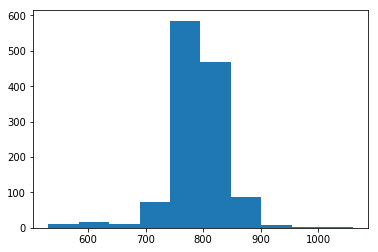

In [819]:
sq=np.abs(tmp[:,0,:]-tmp[:,1,:])[:,2]

plt.hist(np.abs(tmp[:,0,:]-tmp[:,1,:])[:,2])
plt.show()

In [817]:
sq

array([ 787.2547984 ,  787.2547984 ,  779.96409299, ...,  796.97138153,
        809.01254159,  807.95166109])

In [204]:
for i,img in enumerate(ers):
    cv2.imwrite('errors2/%d.png' % i,img[0])

In [505]:
1280-450

830

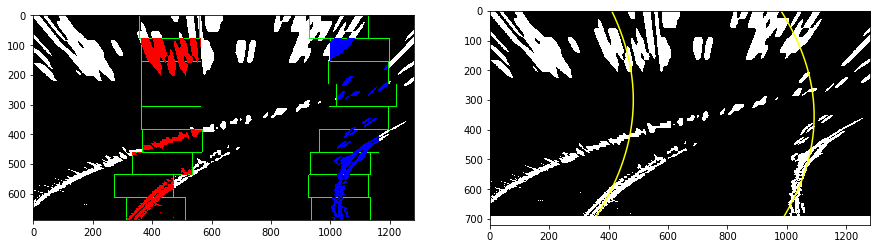

(array([ -8.12208150e-04,   4.86453267e-01,   4.10578663e+02]),
 array([ -8.89558307e-04,   6.29997647e-01,   9.80291463e+02]))

In [64]:
binary_warped=pr(binarize(undistort(img)))
fit_poly(binary_warped, verbose=True)


In [387]:
def binarize(img, s_thresh=(120, 255), sx_thresh=(20, 255),l_thresh=(40,255)):
    img = np.copy(img)
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    #h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    # sobelx = abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255))
    # l_channel_col=np.dstack((l_channel,l_channel, l_channel))
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold saturation channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    # Threshold lightness
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    channels = 255*np.dstack(( l_binary, sxbinary, s_binary)).astype('uint8')        
    binary = np.zeros_like(sxbinary)
    binary[((l_binary == 1) & (s_binary == 1) | (sxbinary==1))] = 1
    #binary = 255*np.dstack((binary,binary,binary)).astype('uint8')            
    return  np.uint8(binary)

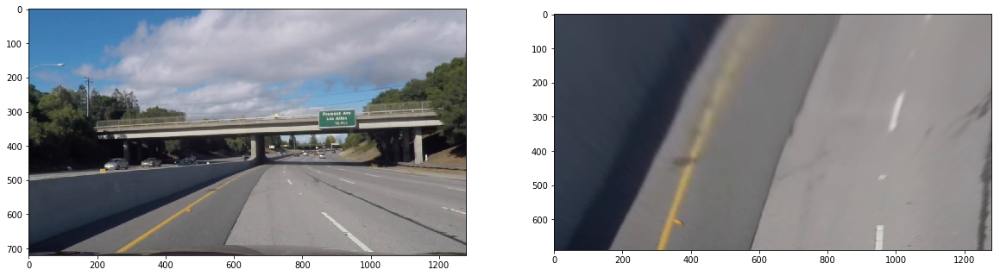

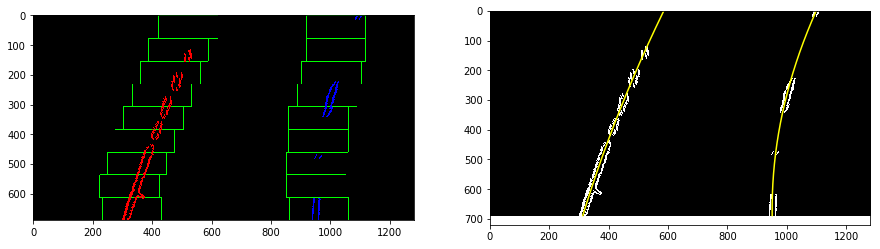

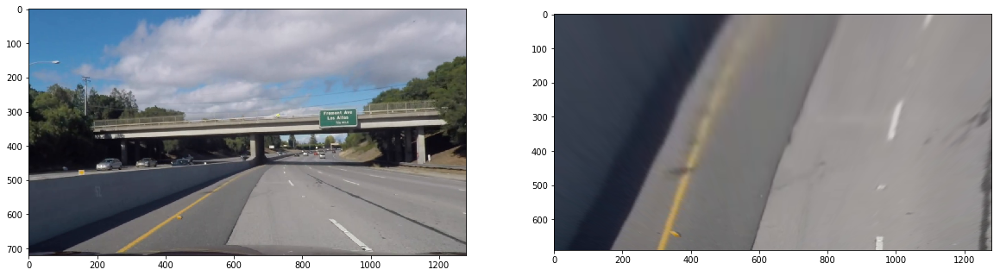

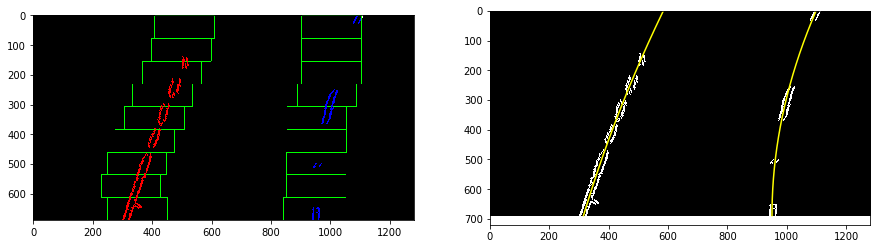

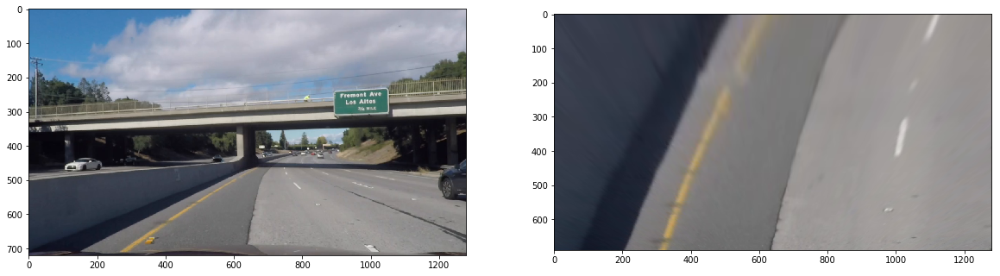

...

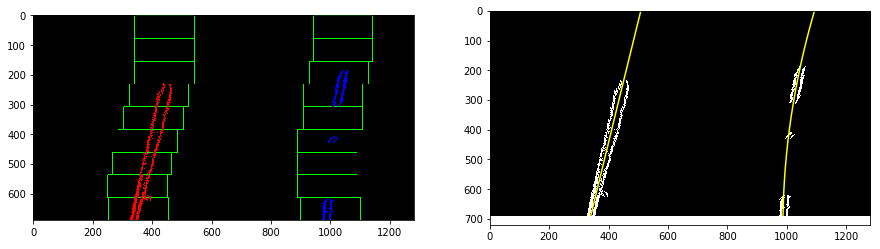

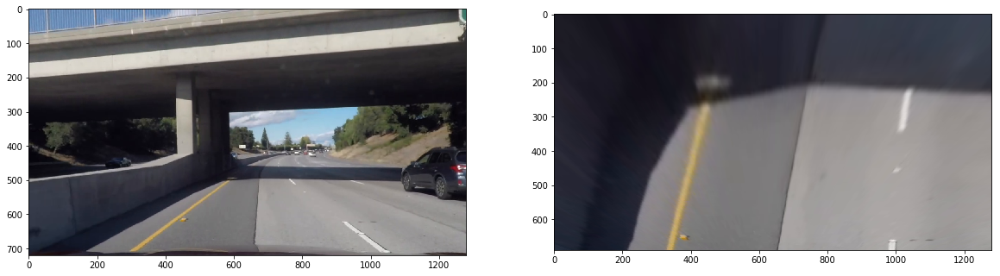

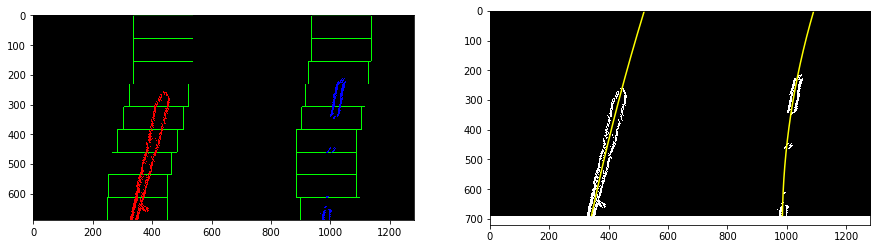

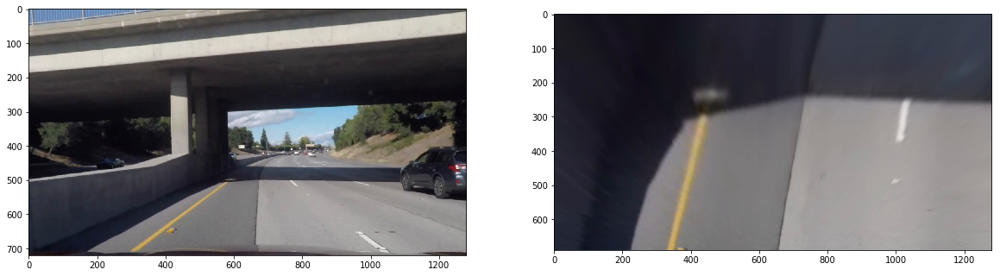

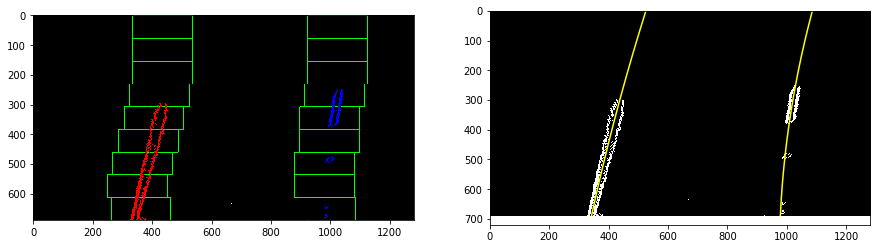

CPU times: user 20.8 s, sys: 2.7 s, total: 23.5 s
Wall time: 18.6 s


In [521]:
%%time
for img in ers[:10]:
    img=img[0]
    img=undistort(img)
    fig,ax=plt.subplots(1,2)
    fig.set_figheight(10)
    fig.set_figwidth(20)
    ax[0].imshow(img)
    ax[1].imshow(pr(img))
    
    plt.show()
    
    binary_warped=(binarize(pr(get_yellow_and_white(img))))
    l,r=fit_poly(binary_warped, verbose=True)
    
    

In [208]:
from skimage.exposure import equalize_adapthist

In [591]:
ers=[a[0] for a in l.errors]

In [731]:
def binarize(img, l_tresh=15, s_tresh=25):
    l_sobel = abs_sobel_thresh(img, channel='l',  thresh=(l_tresh,255))
    s_sobel = abs_sobel_thresh(img, channel='s',  thresh=(s_tresh,255))
    
    return s_sobel | l_sobel

def binarize_yellow(img, f=binarize, params={}):
    return f(get_yellow_and_white(img),**params)

def binarize_absl(img, s_thresh=120, sx_thresh=20,l_thresh=40):
    abss = abs_sobel_thresh(img, orient='x', channel='l',thresh=(sx_thresh,255))
    s=channel_select(img, channel='s', thresh=(s_thresh,255))
    l=channel_select(img, channel='l', thresh=(l_thresh,255))

    return (l*s)|abss


In [841]:
def check_lines(lines):
        """
        Checking that lines are almost parallel and distance between them is big
        """
        div=np.abs(lines[0]-lines[1])
        #print (div.tolist())
        if div[0]<0.0001 and div[1]<0.7 and div[2]>600 and div[2]<950:
            return True
            
        return False

In [744]:
def max_sorted(q):
    tmp=[a for a in q]
    tmp_sum=[-sum(a) for a in tmp]
    return [tmp[i] for i in np.argsort(tmp_sum)]

In [829]:
ers=[a[0] for a in l.errors]

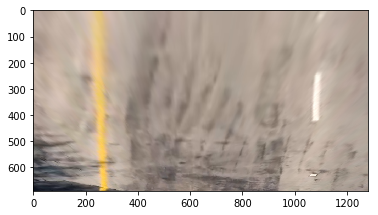

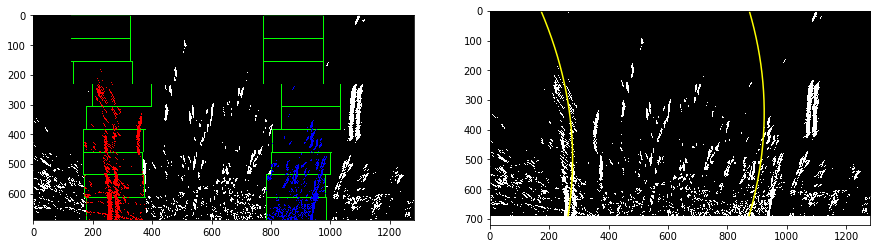

ok <function binarize at 0x122cdb950> {'s_tresh': 35, 'l_tresh': 15} True


In [842]:
from itertools import product

    

functions=\
[(binarize_yellow,{})]+\
[(binarize_yellow,{'f':binarize,'params':{'l_tresh':a[0],'s_tresh':a[1]}}) \
           for a in max_sorted(product(range(5,50,5),range(5,50,5)))]+\
[(binarize,{'l_tresh':a[0],'s_tresh':a[1]}) \
           for a in max_sorted(product(range(5,50,5),range(5,50,5)))]+\
[(binarize_absl,{'s_thresh':a[0],'l_tresh':a[1],'sx_thresh':a[2]}) \
           for a in max_sorted(product(range(5,50,5),range(5,50,5),range(5,120,5)))]


        
#functions=[(binarize_absl,{'s_thresh':a[0],'l_thresh':a[1],'sx_thresh':a[2]}) \
#           for a in max_sorted(product(range(5,50,5),range(5,50,5),range(5,120,5)))]




for img in ers[:1]:
    image=pr(undistort(img))
    plt.imshow(image)
    plt.show()
    for f,params in functions:#(binarize_yellow, binarize, binarize_absl):
        res=True
        try:
            lines=fit_poly(f(image,**params))
        except:
            res=False
        res=res & check_lines(lines)
        if res:
            lines=fit_poly(f(image,**params),verbose=True)
            print ('ok',f,params,check_lines(lines))
            break
    if not res:
        print ('fuck!')
        plt.imshow(img)
        plt.show()

In [763]:
f(image,**params)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ..., 
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

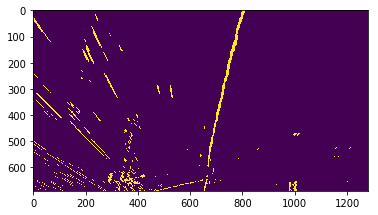

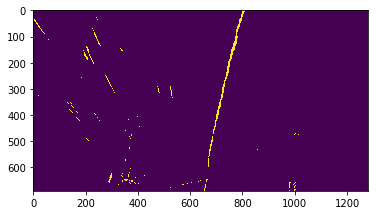

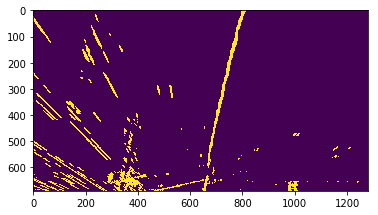

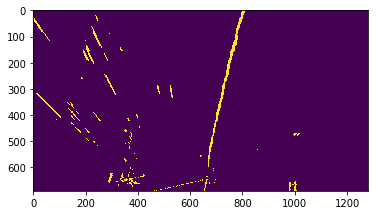

In [728]:
tmp=pr(binarize(img,10,15))

kernel = np.ones((3,3),np.uint8)
erosion = cv2.erode(tmp,kernel,iterations = 1)
dilation = cv2.dilate(tmp,kernel,iterations = 1)
openn=cv2.morphologyEx(tmp, cv2.MORPH_OPEN, kernel)

plt.imshow(tmp)
plt.show()

plt.imshow(erosion)
plt.show()

plt.imshow(dilation)
plt.show()

plt.imshow(openn)
plt.show()

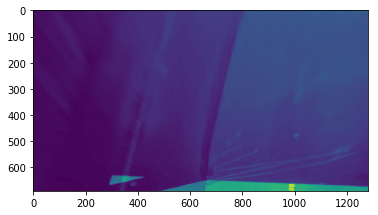

In [669]:
#hls = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
#plt.imshow(hls[:,:,2])
#plt.show()

#plt.imshow(binarize_lab(pr(img),s_thresh=250,B_thresh=0))
plt.imshow(get_channel(pr(img),'gray'))
plt.show()

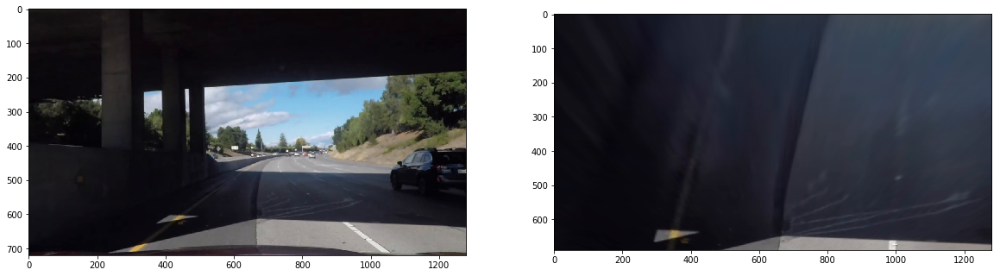

(690, 1280)


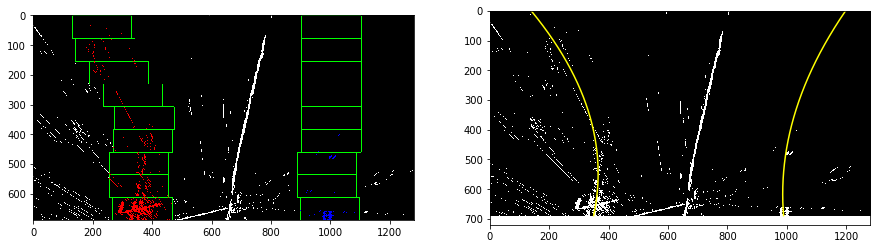

In [620]:

for img in ers[:1]:
    img=undistort(img)
    #img=np.uint8(equalize_adapthist(img,kernel_size=(5,5))*255)
    fig,ax=plt.subplots(1,2)
    fig.set_figheight(10)
    fig.set_figwidth(20)
    ax[0].imshow(img)
    ax[1].imshow(pr(img))
    
    plt.show()
    #def get_yellow_and_white(image, white=170, yellow_part=0.9):
    binary_warped=(binarize(pr((img))))
    print (binary_warped.shape)
    try:
        l,r=fit_poly(binary_warped, verbose=True)
    except:
        print ('fail')
    

In [214]:
help(equalize_adapthist)

Help on function equalize_adapthist in module skimage.exposure._adapthist:

equalize_adapthist(image, kernel_size=None, clip_limit=0.01, nbins=256, **kwargs)
    Contrast Limited Adaptive Histogram Equalization (CLAHE).
    
    An algorithm for local contrast enhancement, that uses histograms computed
    over different tile regions of the image. Local details can therefore be
    enhanced even in regions that are darker or lighter than most of the image.
    
    Parameters
    ----------
    image : (M, N[, C]) ndarray
        Input image.
    kernel_size: integer or list-like, optional
        Defines the shape of contextual regions used in the algorithm. If
        iterable is passed, it must have the same number of elements as
        ``image.ndim`` (without color channel). If integer, it is broadcasted
        to each `image` dimension. By default, ``kernel_size`` is 1/8 of
        ``image`` height by 1/8 of its width.
    clip_limit : float, optional
        Clipping limit, nor

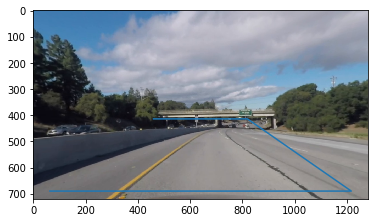

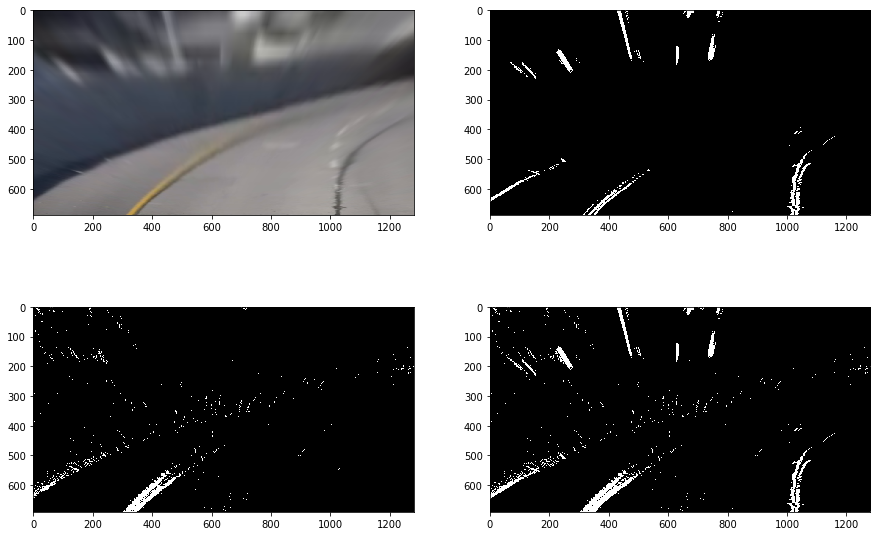

In [239]:
imp=np.copy(ers[0])
img=undistort(img)
plt.imshow(img)
plt.plot([a[0] for a in trapece],[a[1] for a in trapece])

fig,ax=plt.subplots(2,2)
fig.set_figheight(10)
fig.set_figwidth(15)

img=pr(img)

ax[0][0].imshow( (img))
l_sobel = abs_sobel_thresh(img, channel='l',  thresh=(15,255))
ax[0][1].imshow((l_sobel), cmap='gray')
s_sobel = abs_sobel_thresh(img, channel='s',  thresh=(25,255))
ax[1][0].imshow((s_sobel), cmap='gray')
s_sobel = abs_sobel_thresh(img, channel='s',  thresh=(25,255))
ax[1][1].imshow((s_sobel | l_sobel), cmap='gray')

plt.show()

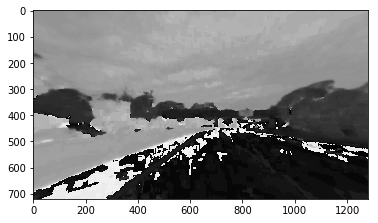

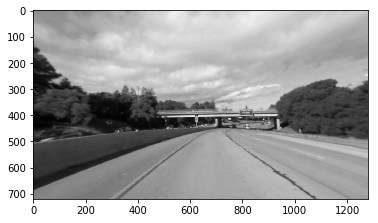

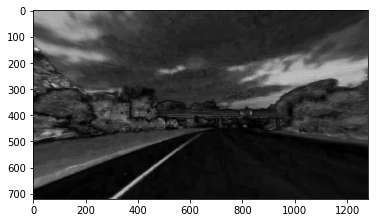

In [227]:
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

for a in range(3):
    plt.imshow(hls[:,:,a], cmap='gray')
    plt.show()

In [231]:
ers[0][0].shape

(720, 1280, 3)

In [233]:
binarize(ers[0][0]).shape

(720, 1280)

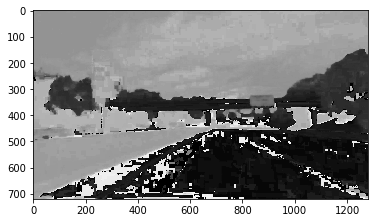

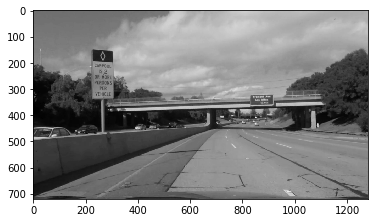

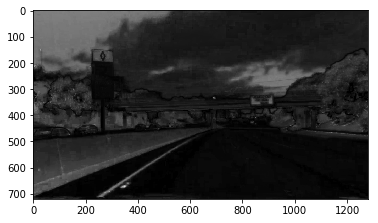

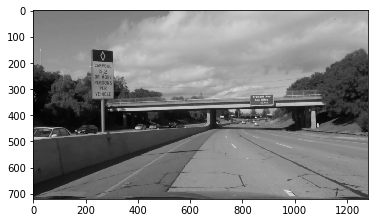

In [244]:
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

for a in range(3):
    plt.imshow(hls[:,:,a], cmap='gray')
    plt.show()
    
plt.imshow(gray, cmap='gray')
plt.show()

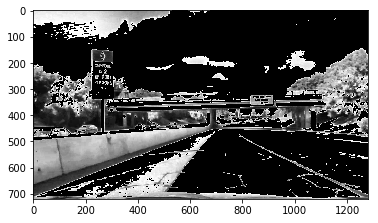

In [257]:
tmp=equalize_adapthist(gray)
tmp[tmp>1/2]=0
plt.imshow(tmp,cmap='gray')
plt.show()

In [341]:
def empty(n):
    return [None for j in range(n)]

def moving_average(a, n=3) :
    assert(n % 2==1)
    q=int((n-1)/2)
    a=[None for i in range(q)]
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

#def moving_average_2d(img, n=3):
    

In [369]:
def moving_average(arr, n=3) :

    half=int((n-1)/2)

    arrs=np.array([np.concatenate([empty(i),arr,empty(n-i-1)]) for i in range(n)],\
                  dtype=np.float)
    dv=len(arrs)-np.isnan(arrs).sum(axis=0)
    arrs[np.isnan(arrs)]=0
    return (arrs.sum(axis=0)/dv)[half:-half]
    
def moving_average2d

array([[ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  0.,  0.],
       [ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  0.],
       [ 0.,  0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.]])

In [352]:
arrs

array([[1, 2, 3, 4, 5, 6, 7, 8, None, None],
       [None, 1, 2, 3, 4, 5, 6, 7, 8, None],
       [None, None, 1, 2, 3, 4, 5, 6, 7, 8]], dtype=object)

In [370]:
# Define a function that thresholds the L-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_lthresh(img, thresh=(220, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_l = hls[:,:,1]
    hls_l = hls_l*(255/np.max(hls_l))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output

In [429]:
def lab_bthresh(img, thresh=(190,255)):
    # 1) Convert to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    # don't normalize if there are no yellows in the image
    lab_b = lab_b*(255/np.max(lab_b))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    # 3) Return a binary image of threshold result
    return binary_output

In [433]:
def binarize(img, lab_thresh=(190,255), hls_thresh=(220, 255)):
    # Undistort
    # Perspective Transform
    
    # Sobel Absolute (using default parameters)
    #img_sobelAbs = abs_sobel_thresh(img_unwarp)

    # Sobel Magnitude (using default parameters)
    #img_sobelMag = mag_thresh(img_unwarp)
    
    # Sobel Direction (using default parameters)
    #img_sobelDir = dir_thresh(img_unwarp)
    
    # HLS S-channel Threshold (using default parameters)
    #img_SThresh = hls_sthresh(img_unwarp)

    # HLS L-channel Threshold (using default parameters)
    img_LThresh = hls_lthresh(img, thresh=hls_thresh)

    # Lab B-channel Threshold (using default parameters)
    img_BThresh = lab_bthresh(img,thresh=lab_thresh)
    
    # Combine HLS and Lab B channel thresholds
    combined = np.zeros_like(img_BThresh)
    combined[(img_LThresh == 1) | (img_BThresh == 1)] = 1
    return combined#, Minv
    
print('...')

...


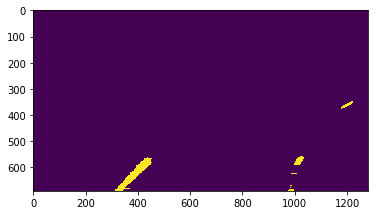

In [437]:
#img=l.images[-1]
plt.imshow((binarize(pr(img),lab_thresh=(180,255),hls_thresh=(190,255))))

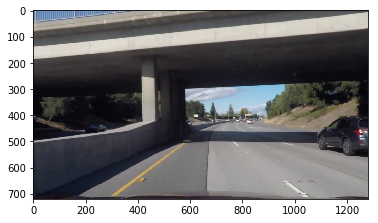

In [426]:
plt.imshow(img)

In [511]:
def binarize2(img, s_thresh=120, sx_thresh=20,l_thresh=40):
    abss = abs_sobel_thresh(img, orient='x', channel='l',thresh=(sx_thresh,255))
    s=channel_select(img, channel='s', thresh=(s_thresh,255))
    l=channel_select(img, channel='l', thresh=(l_thresh,255))

    return (l*s)|abss

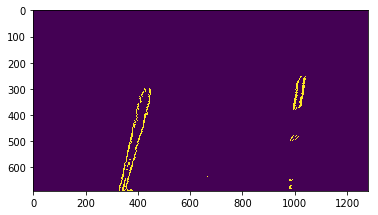

In [520]:
plt.imshow(binarize2(pr(get_yellow_and_white(img))))

In [516]:
def get_yellow_and_white(image, white=170, yellow_part=0.9):
    """Pickes yellow and white colors from image.
    We pick white color as color with all coordinates>=white
    We pick yellow  as all colors with red>150 and blue/green<0.9
    
    Of course our goal is to select most white and yellow and to get rid off most non white and non yellow colors
    """
    
    
    tmp=(cv2.inRange(image[:,:,0],150,255)  &\
    cv2.inRange(image[:,:,2]/image[:,:,1],0,yellow_part)) | \
    (cv2.inRange(image[:,:,0],white,255) \
    & cv2.inRange(image[:,:,1],white,255)\
    & cv2.inRange(image[:,:,2],white,255))
    
    tmp2=np.where(tmp==0)
    
    image1=image.copy()
    

    image1[tmp2]=[0,0,0]
    return image1



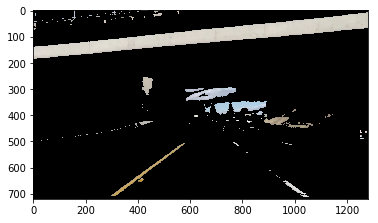

In [519]:
plt.imshow(get_yellow_and_white(img))
plt.show()

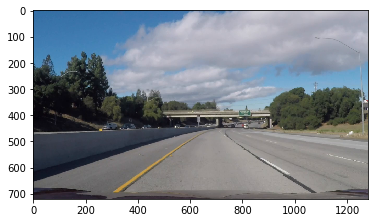

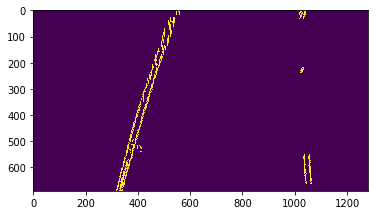

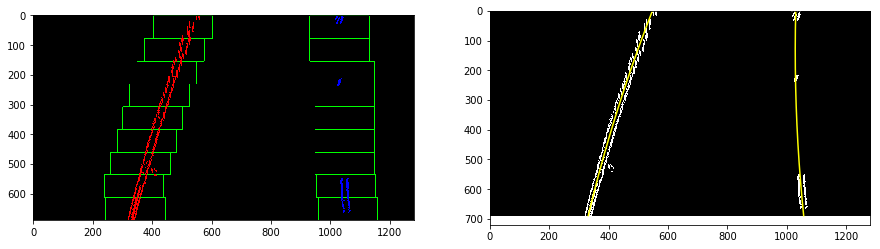

In [538]:
plt.imshow(l.errors[0][0])
plt.show()

tmp=binarize2(pr(get_yellow_and_white(l.errors[0][0])))

plt.imshow(tmp)
plt.show()

l=fit_poly(tmp,verbose=True)

In [540]:
(l[0]-l[1]).tolist()

[1.75720606337891e-05, -0.3639651874267272, -482.2326714463708]

In [824]:
l.errors

[]